# Running the Spatial Logistic Model

In [1]:
from gillespie_OU import Environment as EnvOU
from gillespie_RBM import Environment as EnvBM
from gillespie_sessile import Environment as EnvSess

import numpy as np
import pandas as pd

from scipy.integrate import quad

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('darkgrid')
sns.set_context('talk')

from p_tqdm import p_umap
from tqdm import tqdm

**Parameterization**

Area:

Let $K = \sqrt{-\log(1-h)}$ and $h = 0.95$

$$
A = \pi \rho^2 = \tau g K^2 = - \log(0.05) \tau g = \log(20) \tau g
$$

*Tapirus Terrestris (Anta)*

$A = 5km^2$
$\tau = 0.3 $ days

$$
\therefore g = 5 /(0.3 \log(20)) \approx 5.6 \text{ km²/day}
$$


In [2]:
env = EnvOU(Nagents=100,
            inter_distance=.1,
            birth_rate=2.,
            death_rate=0.,#.1,
            inter_rate=300.,
            tau=1e-2,#-4,
            sigma=1e-4,
            centers='random',#np.zeros((100, 2)),
            dispersal_kernel=1e1,
            data_interval=50,
            env_size=4.,
            id=1)

In [3]:
env.run(900)

{'T': 3.5219486224655316,
 'steps': 900,
 'aveN': 64,
 'id': 1,
 'tau': 0.01,
 'sigma': 0.0001,
 'birthRate': 2.0,
 'deathRate': 0.0,
 'interDistance': 0.30000000000000004,
 'interRate': 300.0,
 'dispersal': 10.0,
 'envSize': 4.0,
 'cause': 'timeout',
 'PCFxs': array([0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.325, 0.375, 0.425,
        0.475, 0.525, 0.575, 0.625, 0.675, 0.725, 0.775, 0.825, 0.875,
        0.925, 0.975, 1.025, 1.075, 1.125, 1.175, 1.225, 1.275, 1.325,
        1.375, 1.425, 1.475, 1.525, 1.575, 1.625, 1.675, 1.725, 1.775,
        1.825, 1.875, 1.925, 1.975]),
 'PCFys': array([0.        , 0.        , 0.        , 0.14210263, 0.        ,
        0.        , 1.22426879, 1.12734751, 0.64364131, 1.20413279,
        1.32629119, 1.25421015, 1.1140846 , 1.03155982, 0.78891459,
        0.89845532, 1.05500436, 0.93787734, 0.86029699, 0.89269599,
        0.82488842, 1.22604825, 1.21576693, 0.86773307, 0.83231539,
        0.89719698, 0.97595012, 1.01280418, 1.08197439, 0.99471839,


In [4]:
def run_environment(dic):
        Env = dic['env']
        env = Env(Nagents=50,
                inter_distance=.3,
                birth_rate=2.,
                death_rate=.1,
                inter_rate=1.,
                tau=dic['taus'],
                sigma=dic['sigma'],
                centers='random',
                dispersal_kernel=dic['disp'],
                data_interval=50,
                transient_steps=int(5e2),
                env_size=4.,
                seed=dic['seed'],
                id=dic['rep'])
        return env.run(int(5e4))

In [5]:
def noise_to_tau(noise, sigma):
    return 2*sigma*sigma/noise

In [6]:
reps = 50
noise = [1, 5, 10]#np.geomspace(1e-3, 1e1, num=8)#[3e-3, 3e-2, 3e-1 , 3e1, 3e3]#, 3e5] # 3e-7, 
dispersals = [0., 1e-2 , 1e-1, 'random']#[0., 1e-9, 1e-6, 1e-4, 1e-3]#[0., .5, 1., 2., 'random']
sigmas = np.geomspace(np.sqrt(1e-3), np.sqrt(1e1), num=20) # remember that sigma is stdev and not variance


seed = 4567

simsOU = []
simsBM = []
simsSS = []
for rep in range(reps):
    for disp in dispersals:
        for s in sigmas:
            for t in noise:
                simsOU.append({'taus': noise_to_tau(noise=t, sigma=s), 'rep':rep, 'seed': seed, 'env': EnvOU, 'disp': disp, 'sigma': s})
                seed += 1
                simsBM.append({'taus': noise_to_tau(noise=t, sigma=s), 'rep':rep, 'seed': seed, 'env': EnvBM, 'disp': disp, 'sigma': s})
                seed += 1
        simsSS.append({'taus':None, 'rep':rep, 'seed': seed, 'env': EnvSess, 'disp': disp, 'sigma': None})
        seed += 1

In [7]:
res2SS = p_umap(run_environment, simsSS)
res2SS = [d | {'mov': 'SS'} for d in res2SS]
res2OU = p_umap(run_environment, simsOU)
res2OU = [d | {'mov': 'OU'} for d in res2OU]
res2BM = p_umap(run_environment, simsBM)
res2BM = [d | {'mov': 'BM'} for d in res2BM]

  0%|          | 0/200 [00:00<?, ?it/s]

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:384: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:384: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:384: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:384: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:384: RuntimeWarning: invalid value encountered in true_divide
 

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

In [8]:
reps = 50
sigmas = [np.sqrt(1e-3), 1e-1, np.sqrt(1e1)]#np.geomspace(1e-3, 1e1, num=8)#[3e-3, 3e-2, 3e-1 , 3e1, 3e3]#, 3e5] # 3e-7, 
dispersals = [0., 1e-2 , 1e-1, 'random']#[0., 1e-9, 1e-6, 1e-4, 1e-3]#[0., .5, 1., 2., 'random']
noise = np.geomspace(1e-1, 1e1, num=6) # remember that sigma is stdev and not variance


seed = 8567

simsOU = []
simsBM = []
simsSS = []
for rep in range(reps):
    for s in sigmas:
        for disp in dispersals:
            for t in noise:
                simsOU.append({'taus': noise_to_tau(noise=t, sigma=s), 'rep':rep, 'seed': seed, 'env': EnvOU, 'disp': disp, 'sigma': s})
                seed += 1
                simsBM.append({'taus': noise_to_tau(noise=t, sigma=s), 'rep':rep, 'seed': seed, 'env': EnvBM, 'disp': disp, 'sigma': s})
                seed += 1
            simsSS.append({'taus':None, 'rep':rep, 'seed': seed, 'env': EnvSess, 'disp': disp, 'sigma': s})
            seed += 1

In [9]:
noiseOU = p_umap(run_environment, simsOU)
noiseOU = [d | {'mov': 'OU'} for d in noiseOU]
noiseBM = p_umap(run_environment, simsBM)
noiseBM = [d | {'mov': 'BM'} for d in noiseBM]
noiseSS = p_umap(run_environment, simsSS)
noiseSS = [d | {'mov': 'SS'} for d in noiseSS]

  0%|          | 0/3600 [00:00<?, ?it/s]

  0%|          | 0/3600 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:383: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:383: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:383: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:383: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:383: RuntimeWarning: invalid value encountered in true_divide
 

In [116]:
env = EnvSess(Nagents=100,
            inter_distance=.3,
            birth_rate=2.,
            death_rate=0.,#.1,
            inter_rate=300.,
            taus=1e3,#-4,
            g_sqrts=np.sqrt(5.6),
            centers='random',#np.zeros((100, 2)),
            dispersal_kernel=1e1,
            data_interval=50,
            env_size=4.,
            id=1)

def plot_heatmap2(self, resolution, ghosted=True, particles=False):
        import matplotlib.pyplot as plt
        import matplotlib.cm as cm
        from matplotlib.colors import Normalize, ListedColormap
        from matplotlib.collections import EllipseCollection


        # make these smaller to increase the resolution
        dx = self.env_size/resolution
        dy = dx

        x = np.arange(0., self.env_size, dx)
        y = np.arange(0., self.env_size, dy)
        y, x = np.meshgrid(x, y)
        # y = y[::-1]
        x = x[::-1]

        # when layering multiple images, the images need to have the same
        # extent.  This does not mean they need to have the same shape, but
        # they both need to render to the same coordinate system determined by
        # xmin, xmax, ymin, ymax.  Note if you use different interpolations
        # for the images their apparent extent could be different due to
        # interpolation edge effects

        # nx, ny = X.shape

        # Z = np.zeros((nx,ny))

        # periodic boundary conditions:
        if ghosted:
            centers = self.costly_ghosted(points=self.centers, hshift=self.env_size)
        else:
            centers = self.centers

        g = .3#2#env.g_sqrts**2
        tau = .3#2#env.taus
        stdev = np.sqrt(g*tau/2)

        asympt_distr = self.asympt_distr(x=x, y=y, centers=centers, stdev=stdev)

        # extent = 
        
        fig, (ax, cax) = plt.subplots(ncols=2, gridspec_kw={'width_ratios': [0.95, 0.05]}, figsize=(7.5,6))

        # color
        cmap = ListedColormap(cm.get_cmap('viridis')(np.linspace(0., 0.5, 256)))
        norm = Normalize(vmin=np.min(asympt_distr), vmax=np.max(asympt_distr))

        # plot heatmap
        im = ax.imshow(asympt_distr, cmap=cmap, norm=norm, extent=tuple([0., self.env_size, 0., self.env_size]))

        radius = .3

        ax.add_collection(EllipseCollection(widths=radius, heights=radius, angles=0, units='xy',
                                            facecolors=(0., 0., 0., 0.),#"transparent",
                                            offsets=self.x, transOffset=ax.transData))

        # plot particles
        # if particles:
            # ax plt.scatter(*self.x.T, color='goldenrod', s=6, )

        # ColorBar
        psm = cm.ScalarMappable(cmap=cmap, norm=norm)
        fig.colorbar(psm, cax=cax, label='asymptotic density')

        return fig

env.plot_heatmap = plot_heatmap2

64


/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:420: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


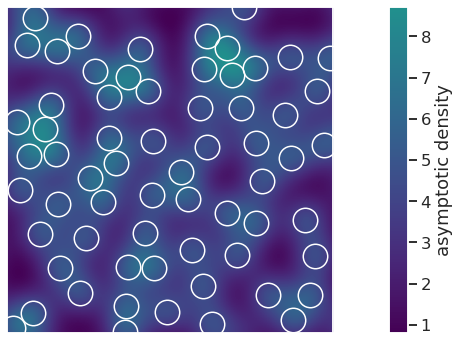

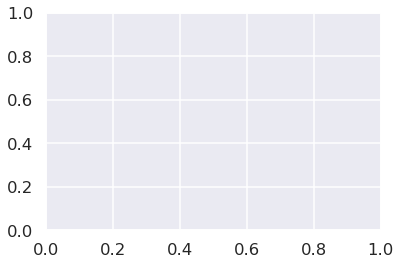

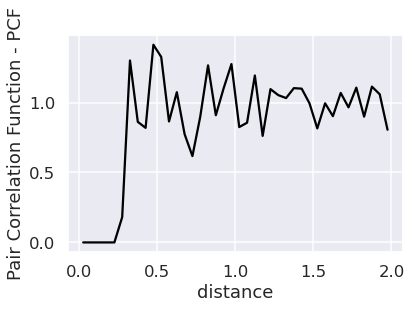

In [117]:
env.run(int(1e5));
print(env.N)
fig = env.plot_heatmap(env, 200, ghosted=True, particles=True)
fig.axes[0].set_xticks([])
fig.axes[0].set_yticks([])
#grid(False)
# sns.despine(fig)
fig, ax = plt.subplots()
ax = env.plot_PCF(resolution=40, max_dist=env.env_size/2)
# ax = env.plot_PCF(max_dist=env.env_size/2, distances='positions', ax=ax)
# fig.show()
fig.savefig('asymptotic_density.png')

# sns.despine(fig)

In [76]:
noiseOU

[{'T': 20.526945136391436,
  'steps': 5050,
  'aveN': 59.208526653324625,
  'id': 0,
  'tau': 0.0005023772863019158,
  'sigma': 0.03162277660168379,
  'birthRate': 2.0,
  'deathRate': 0.1,
  'interDistance': 0.8999999999999999,
  'interRate': 1.0,
  'dispersal': 'random',
  'envSize': 4.0,
  'cause': 'equilibrium',
  'PCFxs': array([0.025, 0.075, 0.125, 0.175, 0.225, 0.275, 0.325, 0.375, 0.425,
         0.475, 0.525, 0.575, 0.625, 0.675, 0.725, 0.775, 0.825, 0.875,
         0.925, 0.975, 1.025, 1.075, 1.125, 1.175, 1.225, 1.275, 1.325,
         1.375, 1.425, 1.475, 1.525, 1.575, 1.625, 1.675, 1.725, 1.775,
         1.825, 1.875, 1.925, 1.975]),
  'PCFys': array([1.13176848, 1.13176848, 1.58447588, 1.13176848, 0.75451232,
         0.9259924 , 0.95765026, 0.75451232, 1.06519387, 0.71480115,
         0.80840606, 0.68890256, 1.40339292, 0.75451232, 1.24884798,
         1.05875116, 0.96028841, 1.00242351, 1.16235682, 0.95765026,
         0.93853972, 0.84224631, 0.67906109, 1.1076883 , 0.993

In [8]:
df['noise'] = [f"{x:.1f}" for x in 2*df['sigma']*df['sigma']/df['tau']]
df['deathRate'] = .1
df['carrCap'] = df['aveN']/(df['envSize']*df['envSize'])
df = df.reset_index()

In [8]:
# resBM2 = resBM.copy()
# del resBM2[]
df = pd.DataFrame.from_records(res2OU)#, exclude=['PCFxs', 'PCFys', 'PCF2xs', 'PCF2ys'])
df = df.append(pd.DataFrame.from_records(res2BM))#, exclude=['PCFxs', 'PCFys']))
df = df.append(pd.DataFrame.from_records(res2SS))#, exclude=['PCFxs', 'PCFys']))
df['noise'] = [f"{x:.1f}" for x in 2*df['sigma']*df['sigma']/df['tau']]
df['deathRate'] = .1
df['carrCap'] = df['aveN']/(df['envSize']*df['envSize'])
df = df.reset_index()

In [9]:
# df.to_pickle("results_committee_sigma1.zip")

In [4]:
# df  = pd.read_pickle('results_committee1.zip')

In [16]:
df[df['PCF2xs'].notna()]

,index,T,steps,aveN,id,tau,sigma,birthRate,deathRate,interDistance,interRate,dispersal,envSize,cause,testValue,mov,PCF2xs,PCF2ys,carrCap
8400,0,20.526945,5050,59.208527,0,0.000502,0.031623,2.0,0.1,0.9,1.0,random,4.0,equilibrium,0.048681,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 1.8862808070150552, 2.0371832715762603, ...",3.700533
8401,1,71.659828,4720,0.000000,0,0.00317,0.031623,2.0,0.1,0.9,1.0,0.01,4.0,extinct,NaN,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.000000
8402,2,14.979708,5050,94.478356,0,0.0002,0.031623,2.0,0.1,0.9,1.0,0.1,4.0,equilibrium,0.060906,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[1.629746617261008, 0.5432488724203359, 0.8148...",5.904897
8403,3,14.354993,5100,98.110828,0,0.00317,0.031623,2.0,0.1,0.9,1.0,random,4.0,equilibrium,0.064944,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[1.2727092492146566, 0.7070606940081423, 0.424...",6.131927
8404,4,19.243274,5300,67.404394,0,0.000502,0.031623,2.0,0.1,0.9,1.0,0.1,4.0,equilibrium,0.059460,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.8315033761535756, 1.1086711682047672, 2.161...",4.212775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11995,3595,14.722157,5100,69.524352,49,2.0,3.162278,2.0,0.1,0.9,1.0,random,4.0,equilibrium,0.064094,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.70539586965937, 0.4702639131062465, 1.41079...",4.345272
11996,3596,16.958597,5700,80.431336,49,5.023773,3.162278,2.0,0.1,0.9,1.0,random,4.0,equilibrium,0.064094,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.70539586965937, 0.23513195655312324, 0.9875...",5.026958
11997,3597,27.012816,9250,78.052131,49,5.023773,3.162278,2.0,0.1,0.9,1.0,0.01,4.0,equilibrium,0.064094,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.6059438642404106, 0.4039625761602737, 1.333...",4.878258
11998,3598,22.115343,7400,88.770008,49,12.619147,3.162278,2.0,0.1,0.9,1.0,random,4.0,equilibrium,0.051319,OU,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[1.1548658002132994, 1.1548658002132992, 0.923...",5.548125


In [12]:
df_bak = df.copy()

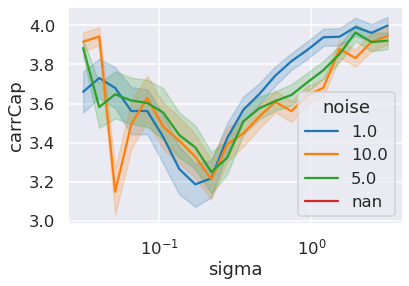

In [15]:
df = df[df['cause'] == 'equilibrium']
df.loc[:,'noise'] = df['noise'].astype('category')

ax = sns.lineplot(data=df, x='sigma', y='carrCap', hue='noise', )
# ax = sns.scatterplot(data=df, x='sigma', y='carrCap', hue='noise', ax=ax, legend=False, alpha=.2)
ax.set_xscale('log')

In [92]:
sns.set_context('talk')

In [18]:
df.loc[(df.dispersal == 0.0) & (df.sigma < 0.04) & (df.noise == '10.0')]

,index,T,steps,aveN,id,tau,sigma,birthRate,deathRate,interDistance,interRate,dispersal,envSize,cause,mov,testValue,noise,carrCap
10,10,23.216621,5900,63.422860,0,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,OU,0.060906,10.0,3.963929
240,240,21.089693,5400,63.877646,1,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,OU,0.060056,10.0,3.992353
482,482,24.191120,6350,53.304553,2,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,OU,0.064094,10.0,3.331535
717,717,19.413932,5050,72.941120,3,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,OU,0.064944,10.0,4.558820
961,961,21.271751,5050,60.442179,4,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,OU,0.036118,10.0,3.777636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22798,10798,15.534938,5100,67.897746,45,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,BM,0.059460,10.0,4.243609
23049,11049,22.560062,7450,81.822555,46,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,BM,0.060906,10.0,5.113910
23283,11283,17.862719,6000,87.045761,47,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,BM,0.059460,10.0,5.440360
23519,11519,14.907309,5050,83.829059,48,0.0002,0.031623,2.0,0.1,0.9,1.0,0.0,4.0,equilibrium,BM,0.060056,10.0,5.239316


In [18]:
df.loc[:,'dispersal'] = df['dispersal'].astype('category')

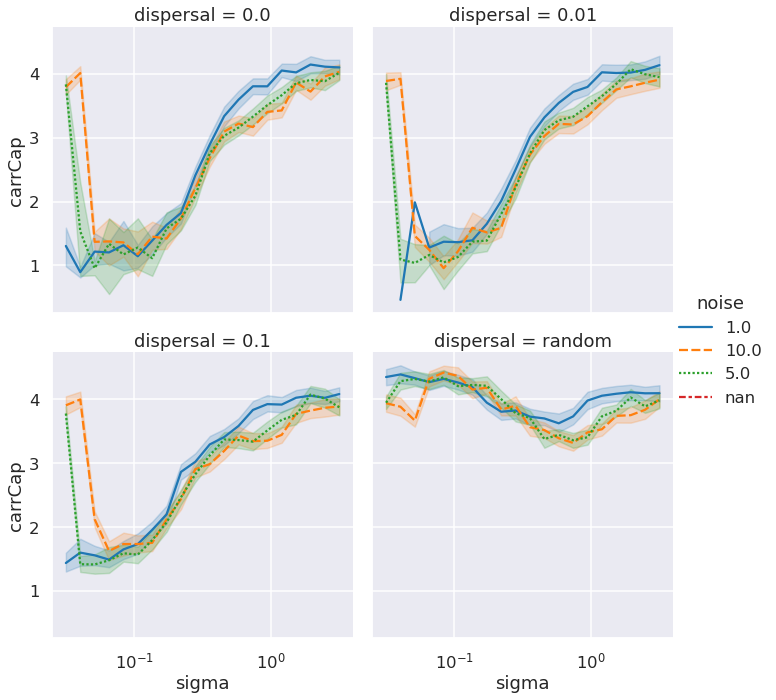

In [21]:
fig = sns.relplot(data=df[df['mov'] == 'OU'], x='sigma', y='carrCap', hue='noise', style='noise', col='dispersal', col_order=[0.0, 0.01, 0.1, 'random'], col_wrap=2, kind='line')

for ax in fig.figure.get_axes():
    ax.set_xscale('log')

#fig.savefig('HR2.pdf')

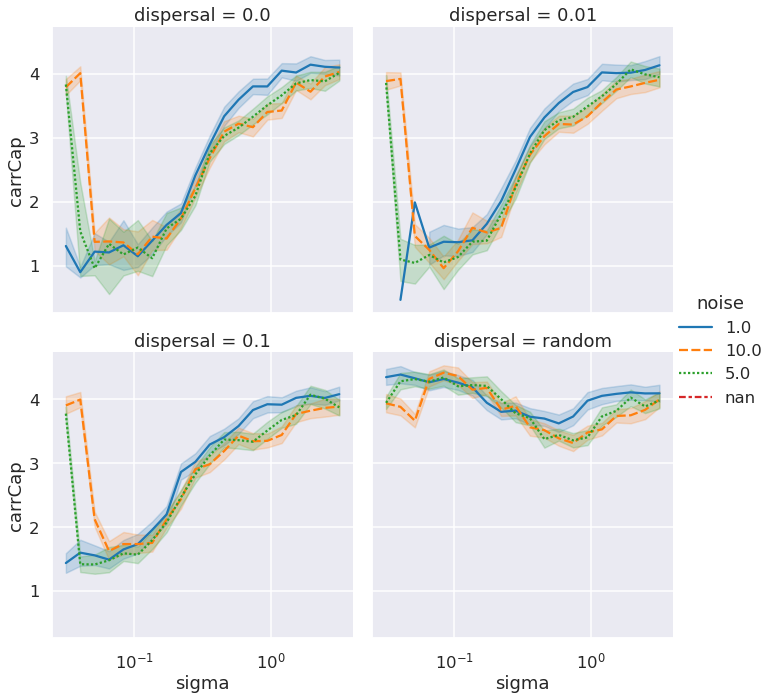

In [24]:
fig = sns.relplot(data=df[df['mov'] == 'OU'], x='sigma', y='carrCap', hue='noise', style='noise', col='dispersal', col_order=[0.0, 0.01, 0.1, 'random'], col_wrap=2, kind='line')

for ax in fig.figure.get_axes():
    ax.set_xscale('log')

#fig.savefig('HR2.pdf')

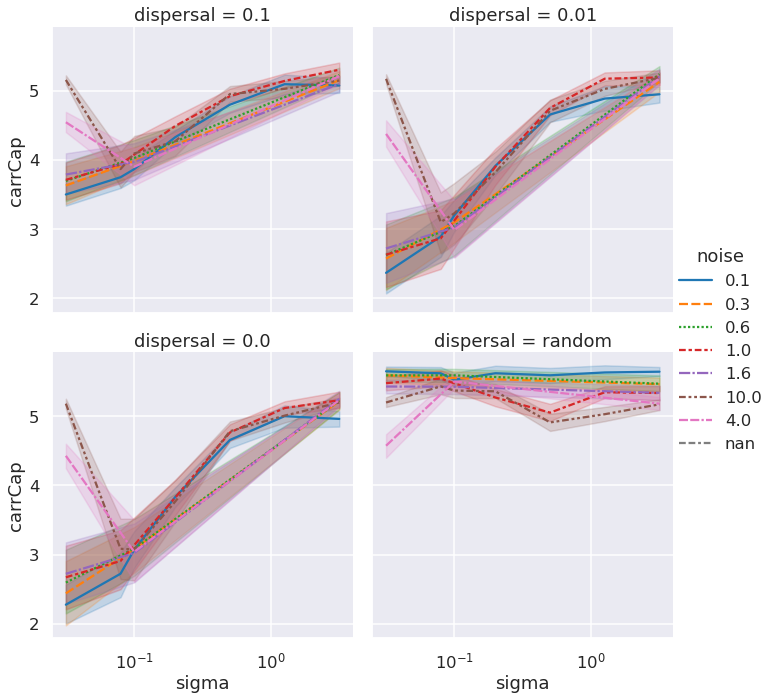

In [11]:
fig = sns.relplot(data=df, x='sigma', y='carrCap', hue='noise', style='noise', col='dispersal', col_wrap=2, kind='line')

for ax in fig.figure.get_axes():
    ax.set_xscale('log')

#fig.savefig('HR.pdf')

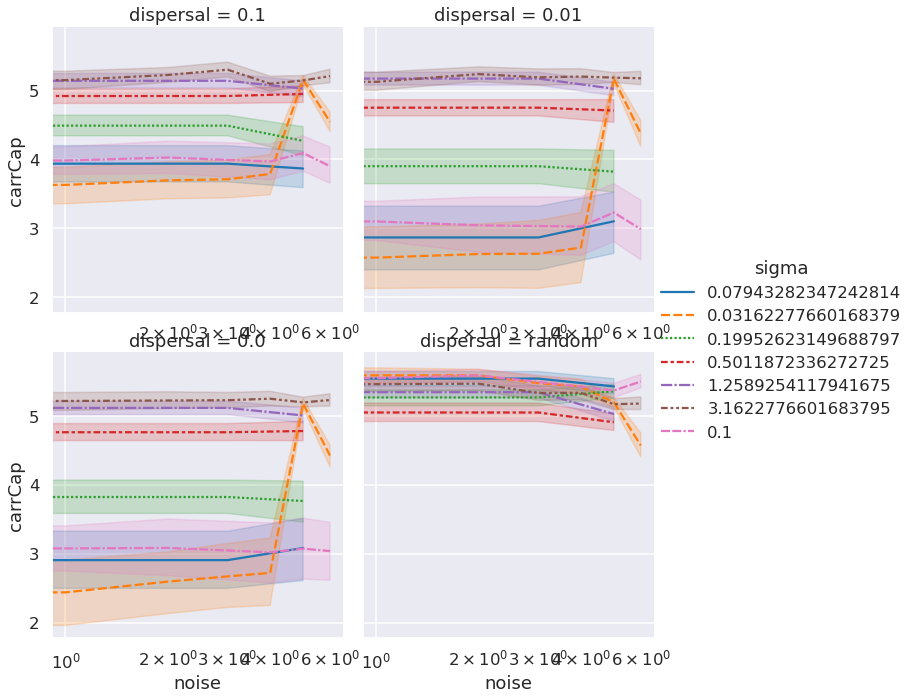

In [12]:
fig = sns.relplot(data=df, x='noise', y='carrCap', hue='sigma', style='sigma', col='dispersal', col_wrap=2, kind='line')

for ax in fig.figure.get_axes():
    ax.set_xscale('log')

#fig.savefig('HR.pdf')

In [160]:
# NOISE

df = pd.DataFrame.from_records(noiseOU, exclude=['PCFxs', 'PCFys'])
df['sigmastr'] = [f"{x:.2f}" for x in df['sigma']]
df = df.append(pd.DataFrame.from_records(noiseSS, exclude=['PCFxs', 'PCFys']))
df = df.append(pd.DataFrame.from_records(noiseBM, exclude=['PCFxs', 'PCFys']))
df['noise'] = 2*df['sigma']*df['sigma']/df['tau']
df['deathRate'] = .1
df['carrCap'] = df['aveN']/(df['envSize']*df['envSize'])
df = df.reset_index()

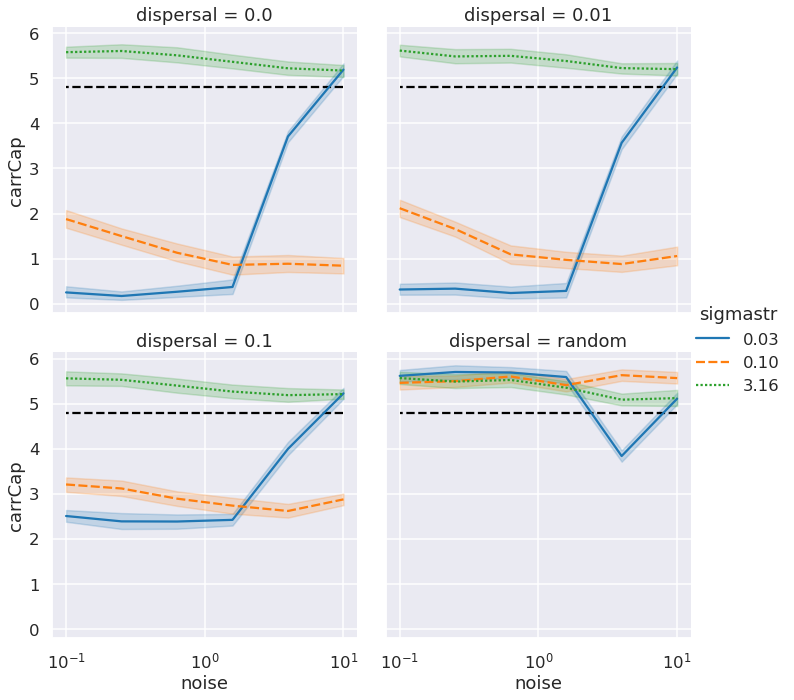

In [161]:
fig = sns.relplot(data=df, x='noise', y='carrCap', hue='sigmastr', style='sigmastr', col='dispersal', col_order=[0.0, 0.01, 0.1, 'random'], col_wrap=2, kind='line')

for ax in fig.figure.get_axes():
    ax.set_xscale('log')
    ax.hlines([4.8],  xmin=1e1, xmax=1e-1, linestyles='--', colors='k')

fig.savefig('noise.pdf')

In [47]:
fig.figure.get_axes()

[<AxesSubplot:title={'center':'dispersal = 0.0'}, ylabel='carrCap'>,
 <AxesSubplot:title={'center':'dispersal = 0.01'}>,
 <AxesSubplot:title={'center':'dispersal = 0.1'}, xlabel='sigma', ylabel='carrCap'>,
 <AxesSubplot:title={'center':'dispersal = random'}, xlabel='sigma'>]

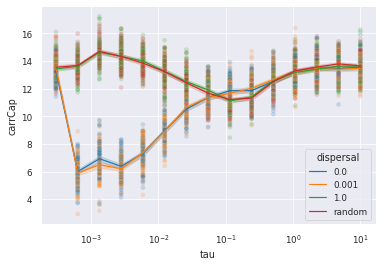

In [ ]:
df['dispersal'] = df['dispersal'].astype('category')

ax = sns.lineplot(data=df, x='tau', y='carrCap', hue='dispersal', )
ax = sns.scatterplot(data=df, x='tau', y='carrCap', hue='dispersal', ax=ax, legend=False, alpha=.2)
ax.set_xscale('log')

In [7]:
(df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2*np.pi*df['interDistance'][0]*df['interDistance'][0])

13.439750749982272

In [12]:
(df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2)

3.8

/home/rafael/mambaforge-pypy3/envs/jl/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='carrCap'>

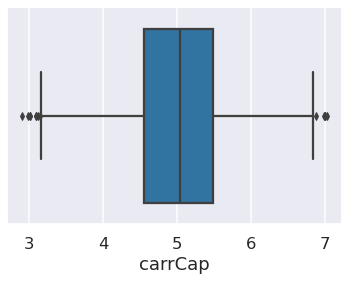

In [62]:
sns.boxplot(df[df['mov'] == 'BM']['carrCap'])

In [9]:
df = pd.read_pickle("results_committee1.zip")

<AxesSubplot:xlabel='T', ylabel='Count'>

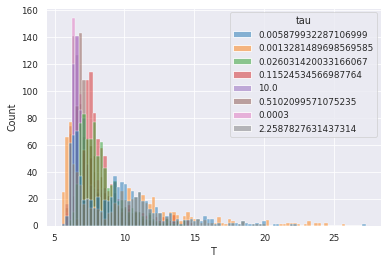

In [207]:
sns.histplot(data=df, x='T', hue='tau')

In [201]:
df.loc[(df['mov'] == 'SS') & (df['dispersal'] == 'random')]['carrCap'].mean()/MFpred

1.1889264774524109

In [205]:
MFpred/df.loc[(df['mov'] == 'OU') & (df['dispersal'] == 0.) & (df['tau'] == taus[1])]['carrCap'].mean()

2.000301810913174

In [27]:
MFpred = (df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/(2*2*np.sqrt(2*np.pi)*0.3))
MFpred

5.71511246615868

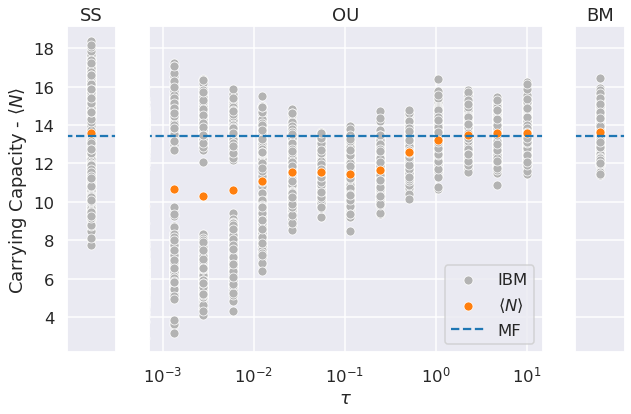

In [18]:
fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]}, figsize=(10,6))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle$")

# SS
axSS = sns.scatterplot(data=df[df['mov'] == 'SS'], y='carrCap', x= 'interRate', ax = axSS, color='0.7')
axSS = sns.scatterplot(y=df[df['mov'] == 'SS']['carrCap'].mean(), x= [1.], ax = axSS, color='C1')
axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")

# OU
axOU = sns.scatterplot(data=df[df['mov'] == 'OU'], y='carrCap', x='tau', ax=axOU, color='0.7', label='IBM')
# mean
taus = df.groupby('tau').mean()['aveN'].index
meanN = df.groupby('tau').mean()['aveN']/((df['envSize'][0]*df['envSize'][0]))
axOU = sns.scatterplot(y=meanN, x=taus, ax=axOU, color='C1', label=r'$\left\langle N \right\rangle$')
axOU.set_title("OU")
axOU.set_xscale('log')
axOU.set_xlabel(r'$\tau$')

# BM
axBM = sns.scatterplot(data=df[df['mov'] == 'BM'], y='carrCap', x= 'interRate', ax = axBM, color='0.7')
axBM = sns.scatterplot(y=df[df['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2*np.pi*df['interDistance'][0]*df['interDistance'][0])
axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', label='MF')
axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axOU.set_xlim(7e-4, 1.5e1)
axSS.set_xlim(.95, 1.05)
axBM.set_xlim(.95, 1.05)

# axOU.set_ylim(8, 19)


axOU.legend()

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

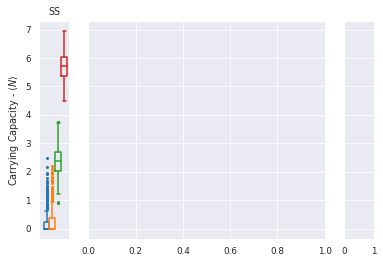

In [19]:
sns.set_context('paper', font_scale=1.)

Ks = {}

for d in dispersals:
    a = df.loc[(df['mov'] == 'OU') & (df['dispersal'] == d)].pivot(columns=['tau'], values=['carrCap']).to_numpy()
    a = [[x for x in s if ~np.isnan(x)] for s in a.T]
    a = np.array(a)
    Ks[d] = a

fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]})#, figsize=np.array([7.38,4.64]))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle$")

# SS
width = 0.08
filled_gap = 0.4
num = len(dispersals)

for idx, d in enumerate(dispersals):
    color = 'C' + str(idx)
    positions = np.array([( 1. + width*idx - filled_gap/2)])
    props = {'linewidth': 1.5, 'color': color}
    a = df.loc[(df['mov'] == 'SS') & (df['dispersal'] == d)].pivot(columns=['tau'], values=['carrCap']).to_numpy()
    a = [x for x in a if ~np.isnan(x)]
    a = np.array(a)
    axSS.boxplot(a, positions=positions, widths=width, sym = '.', medianprops=props, boxprops=props, flierprops={'color': color, 'markeredgecolor': color, 'markerfacecolor': color, 'markersize': '4'}, whiskerprops=props, capprops=props)
    # mean
    meanN = df[df['dispersal'] == d].groupby('tau')['carrCap'].mean()
    # axSS.plot(positions, meanN, '-', color=color, markersize=10, zorder=3, label=d)


axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")
axSS.set_xlim(.7, 1.1)

# BM
width = 0.08
filled_gap = 0.4
num = len(dispersals)

for idx, d in enumerate(dispersals):
    color = 'C' + str(idx)
    positions = np.array([( 1. + width*idx - filled_gap/2)])
    props = {'linewidth': 1.5, 'color': color}
    a = df.loc[(df['mov'] == 'BM') & (df['dispersal'] == d)].pivot(columns=['tau'], values=['carrCap']).to_numpy()
    a = [x for x in a if ~np.isnan(x)]
    a = np.array(a)
    axBM.boxplot(a, positions=positions, widths=width, sym = '.', medianprops=props, boxprops=props, flierprops={'color': color, 'markeredgecolor': color, 'markerfacecolor': color, 'markersize': '4'}, whiskerprops=props, capprops=props)
    # mean
    meanN = df[df['dispersal'] == d].groupby('tau')['carrCap'].mean()
    # axBM.plot(positions, meanN, '-', color=color, markersize=10, zorder=3, label=d)


axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")
axBM.set_xlim(.7, 1.1)

# OU
taus = df.groupby('tau').mean()['carrCap'].index

gap = taus[1]/taus[0]
filled_gap = gap**(1/2)
num = len(dispersals)

for idx, d in enumerate(dispersals):
    color = 'C' + str(idx)
    half_gap = np.sqrt(filled_gap)
    small_gap = filled_gap**(1/(num-1))
    positions = (taus * small_gap**idx)/half_gap
    props = {'linewidth': 1.5, 'color': color}
    axOU.boxplot(Ks[d].T, positions=positions, widths=positions*(small_gap**(2/3) - 1), sym = '.', medianprops=props, boxprops=props, flierprops={'color': color, 'markeredgecolor': color, 'markerfacecolor': color, 'markersize': '4'}, whiskerprops=props, capprops=props)
    # mean
    meanN = df[df['dispersal'] == d].groupby('tau')['carrCap'].mean()
    axOU.plot(positions, meanN, '-', color=color, markersize=10, zorder=3, label=d)


axOU.set_title("OU")
axOU.set_xscale('log')

# BM
# axBM = sns.scatterplot(data=df[df['mov'] == 'BM'], y='carrCap', x= 'interRate', ax = axBM, color='0.7')
# axBM = sns.scatterplot(y=df[df['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
# axBM.set_title("BM")
# axBM.set_xticks([])
# axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2*np.pi*df['interDistance'][0]*df['interDistance'][0])
axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', color='.3', label='MF')
axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--', color='.3')
axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--', color='.3')
axOU.set_xlim(6e-4, 1.7e1)
# axSS.set_xlim(.95, 1.05)
# axBM.set_xlim(.95, 1.05)

# axOU.set_ylim(8, 19)

axOU.legend(title='Dispersal Scale', loc='lower right')

axOU.set_xlabel(r'Mean HR Crossing Time $\tau - $ days')
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle \; - \; $ind$/$km$^2$")

fig.tight_layout(w_pad=0.2, h_pad=0.)

# fig.savefig('carr_cap3.pdf')

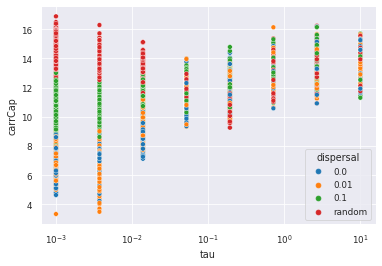

In [18]:
ax = sns.scatterplot(data=df, x='tau', y='carrCap', hue='dispersal')
ax.set_xscale('log')

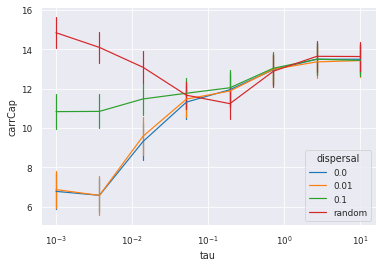

In [19]:
ax = sns.lineplot(data=df, x='tau', y='carrCap', hue='dispersal', ci='sd', err_style='bars')
ax.set_xscale('log')

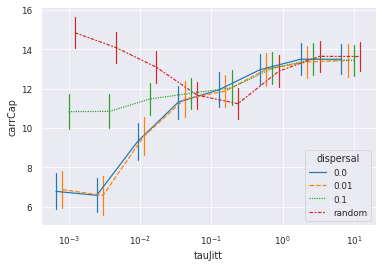

In [21]:
disp_dict = {0.: 1/1.5, 1e-2: np.sqrt(1.5)/1.5, 1.e-1: 1., 'random': 1.5/np.sqrt(1.5)}

auxdf = df.copy()
auxdf['tauJitt'] = auxdf['tau']*np.array([disp_dict[x['dispersal']] for id, x in auxdf.iterrows()])

ax = sns.lineplot(data=auxdf, x='tauJitt', y='carrCap', hue='dispersal', style='dispersal', ci='sd', err_style='bars')
ax.set_xscale('log')

In [22]:
df[df['mov'] == 'SS']

,index,T,steps,aveN,id,tau,gsqrt,birthRate,deathRate,interDistance,interRate,dispersal,envSize,cause,testValue,mov,carrCap
6400,0,7.912785,5050,152.049276,3,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.039094,SS,9.503080
6401,1,7.664093,5050,154.118510,0,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.042546,SS,9.632407
6402,2,7.886697,5050,161.045472,2,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.060056,SS,10.065342
6403,3,7.823548,5300,155.268808,4,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.064944,SS,9.704300
6404,4,8.638216,5450,154.377822,1,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.064944,SS,9.648614
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6795,395,6.518893,5050,203.883053,99,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.064944,SS,12.742691
6796,396,7.923160,5050,179.719879,99,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.064094,SS,11.232492
6797,397,5.558862,5100,246.454571,98,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.064944,SS,15.403411
6798,398,5.554958,5050,265.744153,99,None,None,2.0,0.1,0.3,1.0,NaN,4.0,equilibrium,0.064944,SS,16.609010


<AxesSubplot:xlabel='carrCap', ylabel='Density'>

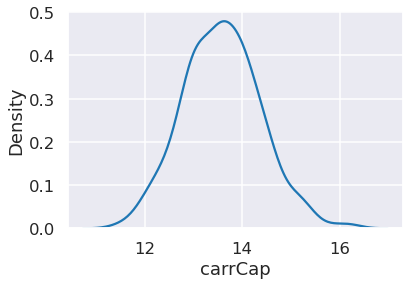

In [41]:
# ax = sns.scatterplot(data=df[df['mov'] == 'SS'], x='tau', y='carrCap', hue='dispersal')
# sns.kdeplot(df[df['mov'] == 'SS']['carrCap'])
sns.kdeplot(df.loc[(df['mov'] == 'OU') & (df['tau'] == taus[14])]['carrCap'])
# ax.set_xscale('log')

## PCF

Carrying Capacities taking into account C_ij

In [22]:
def JTB_carr_cap_torus(b, d, tau, g, q, L, gamma):
    return (b-d)/(gamma*(
        # internal part
        quad(lambda r: (1/8)*r*(8*tau**2*g**2 + q**2*(-2*tau*g + r**2))*np.exp(-1/2*r**2/(tau*g))/(tau**3*g**3), 0, (1/2)*L)[0]
        # across the torus
        + quad(lambda r: (1/16)*r*(8*tau**2*g**2 + q**2*(-2*tau*g + r**2))*(-8*np.arccos((1/2)*L/r) + 2*np.pi)*np.exp(-1/2*r**2/(tau*g))/(np.pi*tau**3*g**3), (1/2)*L, (1/2)*np.sqrt(2)*L)[0]
        ))

In [23]:
def JTB_carr_cap(b, d, tau, g, q, L, gamma, C):
    sigma2 = g*tau/2.
    return (b-d)/(gamma*(
        # internal part
        quad(lambda r: (1/8)*r*C(r)*(8*sigma2**2 + q**2*(r**2 - 2*sigma2))*np.exp(-r**2/(2*sigma2))/(sigma2**3), 0, (1/2)*L)[0]
        ))

In [24]:
def JTB_0lambda_carr_cap(b, d, tau, g, q, L, gamma):
    sigma2 = g*tau/2.
    return (b-d)/(gamma*((1/(2*np.pi*8)*(8*sigma2**2 - q**2*2*sigma2))/(sigma2**3)))

In [25]:
def MF_carr_cap(b, d, tau, g, q, L, gamma):
    return (b-d)/(gamma)

In [26]:
def finite_size_inter(tau, g, q, L):
    return 1 - ( 1 + L*L*q*q/(8*g*g*tau*tau))*np.exp(-L*L/(2*g*tau))

def finite_size_carr_cap(b, d, tau, g, q, L, gamma):
    # sigma2 = g*tau/2.
    return (b-d)/(gamma*finite_size_inter(tau, g, q, L/2))

In [27]:
def empirical_carr_cap(b, d, tau, g, q, L, gamma, C):
    # sigma2 = g*tau/2.
    return (b-d)/(gamma*(
        # internal part
        quad(lambda r: 2*np.pi*r*C(r), 0, q)[0] # /(np.pi*q*q) not taken into account because the IBM does not use this top-hat (it goes within \gamma)
        #quad(lambda r: (1/8)*r*C(r)*(8*sigma2**2 + q**2*(r**2 - 2*sigma2))*np.exp(-r**2/(2*sigma2))/(sigma2**3), 0, (1/2)*L)[0]
        ))

In [28]:
def empirical_SS_carr_cap(b, d, tau, g, q, L, gamma, C):
    return (b-d)/(gamma*(
        # internal part
        quad(lambda r: 2*np.pi*r*C(r), 0, q)[0]
        ))

In [29]:
def empirical_BM_carr_cap(b, d, tau, g, q, L, gamma, C):
    return (b-d)/(gamma*(
        # internal part
        quad(lambda r: 2*np.pi*r*C(r), 0, q)[0]
        ))

In [30]:
from scipy.interpolate import interp1d

def defineC(xs, ys):
    return interp1d(x=xs, y=ys, kind='quadratic', fill_value="extrapolate", bounds_error=False)

Define Interaction rate

In [31]:
# In JTB the interaction kernel is a top-hat function, I used '1', I need to introduce this normalization factor back into the interaction rate.
# The reason is that my interaction was higher than what it would have been if the probability of encounter were corrected

inter_rate_for_compatibility_with_JTB_paper = .5*np.pi*df['interDistance'][0]*df['interDistance'][0]

In [32]:
inter_rate_for_compatibility_with_JTB_paper

0.1413716694115407

Recovering empirical PCFs data

In [110]:
df['PCFxs'] = None
df['PCFys'] = None
df['PCF2xs'] = None
df['PCF2ys'] = None

In [111]:
for r in resOU:
    aux = df.loc[(df['mov'] == 'OU') & (df['tau'] == r['tau']) & (df['id'] == r['id']) & (df['dispersal'] == r['dispersal'])]
    df.at[aux.index[0],'PCFxs'] = r['PCF2xs'] # positions
    df.at[aux.index[0],'PCFys'] = r['PCF2ys'] # positions
    df.at[aux.index[0],'PCF2xs'] = r['PCFxs'] # centers
    df.at[aux.index[0],'PCF2ys'] = r['PCFys'] # centers
    # aux['PCFys'] = r['PCFys']
    # print()

In [112]:
for r in resBM:
    aux = df.loc[(df['mov'] == 'BM') & (df['id'] == r['id']) & (df['dispersal'] == r['dispersal'])]
    df.at[aux.index[0],'PCFxs'] = r['PCFxs']
    df.at[aux.index[0],'PCFys'] = r['PCFys']
    # aux['PCFys'] = r['PCFys']
    # print()

In [113]:
from time import sleep

for r in resSS:
    aux = df.loc[(df['mov'] == 'SS') & (df['id'] == r['id']) & (df['dispersal'] == r['dispersal'])]
    df.at[aux.index[0],'PCFxs'] = r['PCFxs']
    df.at[aux.index[0],'PCFys'] = r['PCFys']
    # aux['PCFys'] = r['PCFys']
    # print()

In [114]:
df.head()

,index,T,steps,aveN,id,tau,sigma,birthRate,deathRate,interDistance,...,envSize,cause,testValue,mov,noise,carrCap,PCFxs,PCFys,PCF2xs,PCF2ys
0,0,24.305155,5050,53.566178,0,0.126191,0.079433,2.0,0.1,0.9,...,4.0,equilibrium,0.056138,OU,0.1,3.347886,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[6.496120126199808, 2.1653733753999362, 2.8582...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[11.693016227159656, 7.362269476359783, 4.6772..."
1,1,58.481022,4844,0.000000,0,0.02,0.031623,2.0,0.1,0.9,...,4.0,extinct,NaN,OU,0.1,0.000000,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,2,32.279386,5050,26.133332,0,0.012619,0.079433,2.0,0.1,0.9,...,4.0,equilibrium,0.043862,OU,1.0,1.633333,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[18.108295747344535, 22.635369684180663, 13.58...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,3,33.800444,5050,34.462972,0,0.001262,0.079433,2.0,0.1,0.9,...,4.0,equilibrium,0.060906,OU,10.0,2.153936,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 17.24178550162199, 7.16197243913529, 9.6...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[270.56340325622205, 2.652582384864922, 0.0, 0..."
4,4,26.954599,5400,39.151151,0,0.012619,0.079433,2.0,0.1,0.9,...,4.0,equilibrium,0.064944,OU,1.0,2.446947,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[5.64316695727496, 4.702639131062465, 2.257266...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[16.929500871824878, 6.583694783487451, 3.9502..."


Calculating aggregated PCFs

In [119]:
df[df['mov'] == 'OU'].iloc[2]['PCFys']

array([18.10829575, 22.63536968, 13.58122181,  3.88034909,  4.52707394,
        0.82310435,  0.34823646,  0.30180493,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.58413857,  1.50902465,  1.68148461,  1.7129469 ,  0.46431528,
        0.77291506,  1.15808868,  0.80481314,  1.733773  ,  1.75539602,
        1.50902465,  0.85416489,  0.98772522,  0.39711175,  0.6905706 ,
        0.44528596,  0.64672485,  0.48753104,  0.81081921,  0.91853674,
        0.70137765,  0.62014711,  0.66397084,  0.47034534,  1.08878993])

(-0.1, 1.7)

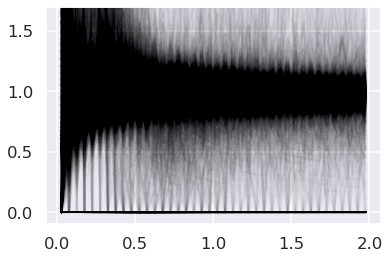

In [120]:
fig, ax = plt.subplots()

agg = np.zeros(40)
reps = 0
for idx, row in df[df['mov'] == 'OU'].iterrows():
    agg += row['PCFys']
    reps += 1
    ax.plot(row['PCFxs'], row['PCFys'], 'k-', alpha=.01)

# C = defineC(row['PCFxs'], agg/reps)
# df.loc[df['mov'] == 'SS', 'empiricalN'] = empirical_SS_carr_cap(b=df['birthRate'][0], d=df['deathRate'][0], tau=0., g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=df['interRate'][0]/2, C=C)

ax.plot(row['PCFxs'], agg/reps, 'k-', alpha=.04)
ax.set_ylim(-0.1, 1.7)

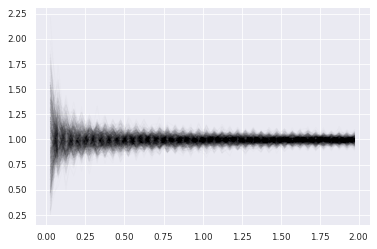

In [39]:
fig, ax = plt.subplots()

agg = np.zeros(40)
reps = 0
for idx, row in df[df['mov'] == 'BM'].iterrows():
    agg += row['PCFys']
    reps += 1
    ax.plot(row['PCFxs'], row['PCFys'], 'k-', alpha=.01)

C = defineC(row['PCFxs'], agg/reps)
df.loc[df['mov'] == 'BM', 'empiricalN'] = empirical_BM_carr_cap(b=df['birthRate'][0], d=df['deathRate'][0], tau=0., g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=df['interRate'][0]/2, C=C)

ax.plot(row['PCFxs'], agg/reps, 'k-', alpha=.04)

/tmp/ipykernel_823822/352334198.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


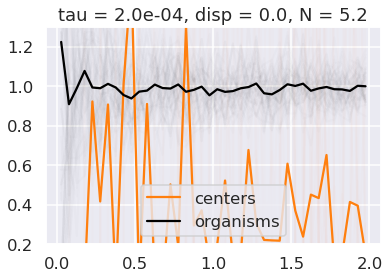

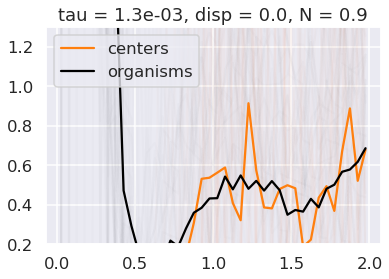

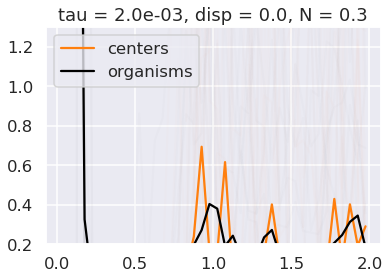

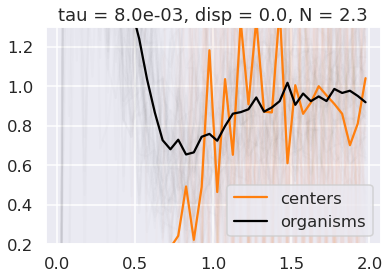

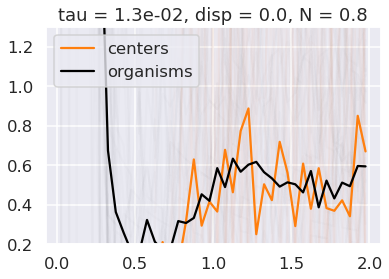

...

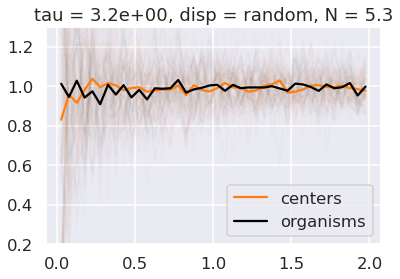

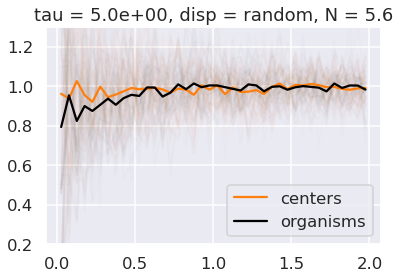

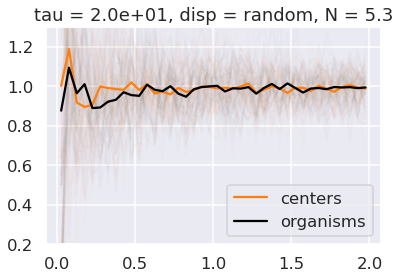

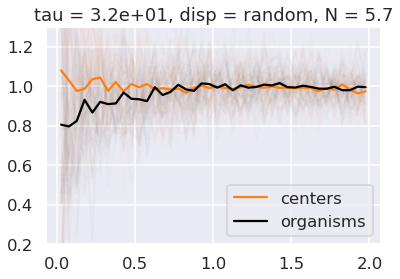

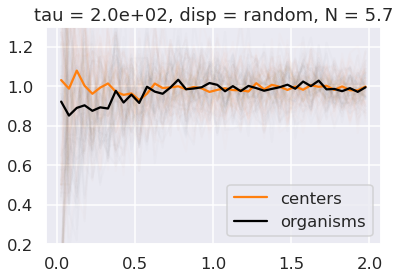

In [123]:
nreps = reps

for d in dispersals:
    filtered_df = df[df['dispersal'] == d]

    for t in taus:

        fig, ax = plt.subplots()

        agg = np.zeros(40)
        agg2 = np.zeros(40)
        reps = 0
        for idx, row in filtered_df.loc[(filtered_df['mov'] == 'OU') & (filtered_df['tau'] == t)].iterrows():
            agg += row['PCFys']
            agg2 += row['PCF2ys']
            reps += 1
            ax.plot(row['PCFxs'], row['PCFys'], 'k-', alpha=.01)
            ax.plot(row['PCF2xs'], row['PCF2ys'], '-', color='C1', alpha=.01)


        # C = defineC(row['PCFxs'], agg/reps)
        # df.loc[(df['mov'] == 'OU') & (df['tau'] == t) & (df['dispersal'] == d), 'empiricalN'] = empirical_carr_cap(b=filtered_df['birthRate'].iloc[0], d=filtered_df['deathRate'].iloc[0], tau=t, g=5.6, q=filtered_df['interDistance'].iloc[0], L=filtered_df['envSize'].iloc[0], gamma=filtered_df['interRate'].iloc[0]/2, C=C)

        # agg =  (agg + np.roll(agg, -1))/2
        # agg = agg[:-1]

        # xs = row['PCFxs']
        # xs =  (xs + np.roll(xs, -1))/2
        # xs = xs[:-1]


        ax.plot(row['PCF2xs'], agg2/reps, '-', color='C1', label='centers')
        ax.plot(row['PCFxs'], agg/reps, 'k-', label='organisms')#, alpha=.04)
        ax.legend()
        ax.set_title(f"tau = {t:2.1e}, disp = {d}, N = {filtered_df.loc[(filtered_df['mov'] == 'OU') & (filtered_df['tau'] == t)]['carrCap'].mean():3.1f}")
        ax.set_ylim(.2, 1.3)

In [93]:
# filtered_df = df[df['dispersal'] == dispersals[0]]

filtered_df = df[df['tau'] == taus[0]]

In [98]:
from itertools import repeat

In [131]:
df[df['cause'] == 'equilibrium'][df['dispersal'] == 0.0]

/tmp/ipykernel_823822/726089474.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[df['cause'] == 'equilibrium'][df['dispersal'] == 0.0]


,index,T,steps,aveN,id,tau,sigma,birthRate,deathRate,interDistance,...,envSize,cause,testValue,mov,noise,carrCap,PCFxs,PCFys,PCF2xs,PCF2ys
2,2,32.279386,5050,26.133332,0,0.012619,0.079433,2.0,0.1,0.9,...,4.0,equilibrium,0.043862,OU,1.0,1.633333,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[18.108295747344535, 22.635369684180663, 13.58...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
9,9,15.324215,5500,98.690406,0,0.0002,0.031623,2.0,0.1,0.9,...,4.0,equilibrium,0.048681,OU,10.0,6.168150,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.4242364164048855, 0.9898849716113992, 0.933...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
11,11,55.889364,6400,18.412778,0,0.126191,0.079433,2.0,0.1,0.9,...,4.0,equilibrium,0.061118,OU,0.1,1.150799,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 20.787584403839386, 8.315033761535757, 1...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
24,24,22.966035,5650,41.957469,0,0.079621,0.199526,2.0,0.1,0.9,...,4.0,equilibrium,0.061118,OU,1.0,2.622342,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[4.619463200853198, 2.3097316004265984, 2.3097...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
26,26,27.891434,6500,52.587809,0,0.796214,0.199526,2.0,0.1,0.9,...,4.0,equilibrium,0.060056,OU,0.1,3.286738,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[2.7944900844667493, 3.2602384318778737, 2.515...","[0.025, 0.07500000000000001, 0.125, 0.17500000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8265,1065,51.296167,6300,19.170137,44,None,None,2.0,0.1,0.9,...,4.0,equilibrium,0.064094,SS,nan,1.198134,None,None,None,None
8286,1086,66.326758,7000,11.217315,45,None,None,2.0,0.1,0.9,...,4.0,equilibrium,0.059460,SS,nan,0.701082,None,None,None,None
8292,1092,65.663311,6400,7.545602,45,None,None,2.0,0.1,0.9,...,4.0,equilibrium,0.061118,SS,nan,0.471600,None,None,None,None
8320,1120,38.009124,5050,25.388374,47,None,None,2.0,0.1,0.9,...,4.0,equilibrium,0.061118,SS,nan,1.586773,"[0.025, 0.07500000000000001, 0.125, 0.17500000...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",None,None


In [129]:
dispersals

[0.0, 0.01, 0.1, 'random']

In [100]:
def generate_aggdf_SS(df):
    agg_df = pd.DataFrame(columns=['dispersal', 'x', 'y'])

    filtered_df = df[df['mov'] == 'SS']
    for d in dispersals:
        for id, row in filtered_df[filtered_df['dispersal'] == d].iterrows():
            agg_df  = pd.concat([agg_df, pd.DataFrame(list(zip(repeat(row['dispersal'], 40), row['PCFxs'], row['PCFys'])), columns=['dispersal', 'x', 'y'])], ignore_index=True)

    return agg_df

(0.0, 2.5)

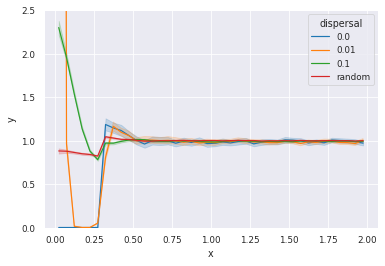

In [51]:
agg = generate_aggdf_SS(df)
ax = sns.lineplot(data=agg, x='x', y='y', hue='dispersal')
ax.set_ylim(0, 2.5)

In [102]:
taus = df.groupby('tau').mean()['aveN'].index

In [105]:
for i in [0, 1, 4, 7]:
    agg = generate_aggdf(df, taus[i])
    sns.lineplot(data=agg, x='x', y='y', hue='dispersal')

TypeError: 'NoneType' object is not iterable

<AxesSubplot:xlabel='x', ylabel='y'>

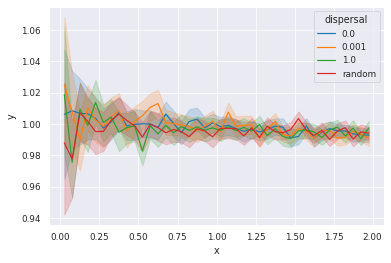

In [110]:
sns.lineplot(data=generate_aggdf(df, taus[0]), x='x', y='y', hue='dispersal')

<AxesSubplot:xlabel='x', ylabel='y'>

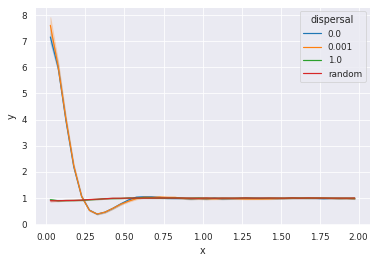

In [111]:
sns.lineplot(data=generate_aggdf(df, taus[1]), x='x', y='y', hue='dispersal')

In [106]:
sns.lineplot(data=generate_aggdf(df, taus[4]), x='x', y='y', hue='dispersal')

TypeError: 'NoneType' object is not iterable

<AxesSubplot:xlabel='x', ylabel='y'>

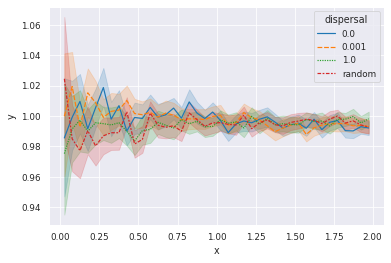

In [120]:
sns.lineplot(data=generate_aggdf(df, taus[7]), x='x', y='y', hue='dispersal', style='dispersal', ci=95)

In [145]:
def generate_aggdf(df, filtervar, filtervalue):
    agg_df = pd.DataFrame(columns=['dispersal', 'x', 'y'])

    filtered_df = df[df[filtervar] == filtervalue]
    for d in dispersals:
        try:
            for id, row in filtered_df[filtered_df['dispersal'] == d].iterrows():
                agg_df  = pd.concat([agg_df, pd.DataFrame(list(zip(repeat(row['dispersal'], 40), row['PCFxs'], row['PCFys'])), columns=['dispersal', 'x', 'y'])], ignore_index=True)
        except:
            pass

    return agg_df

In [139]:
generate_aggdf(df, 'mov', 'OU')

,dispersal,x,y
0,0.0,0.025,18.108296
1,0.0,0.075,22.635370
2,0.0,0.125,13.581222
3,0.0,0.175,3.880349
4,0.0,0.225,4.527074
...,...,...,...
143995,random,1.775,0.971516
143996,random,1.825,1.110027
143997,random,1.875,1.000064
143998,random,1.925,1.052363


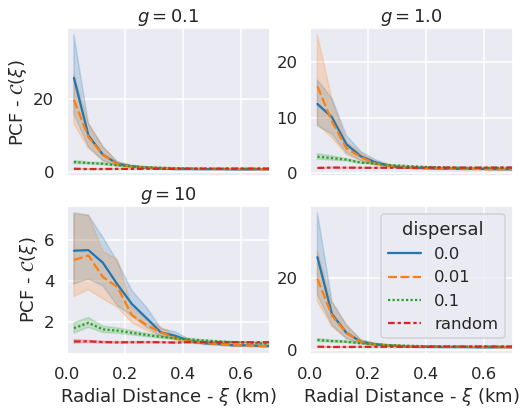

In [157]:
import re

def tex_format(val):
    return re.split('e+|e-',f'{val:2.1e}')

fig, axs = plt.subplots(nrows = 2, ncols = 2, sharex=True, figsize=(8,6))

sns.lineplot(data=generate_aggdf(df, 'noise', '0.1'), x='x', y='y', hue='dispersal', style='dispersal', ci=95, ax=axs[0,0], legend=False)
sns.lineplot(data=generate_aggdf(df, 'noise', '1.0'), x='x', y='y', hue='dispersal', style='dispersal', ci=95, ax=axs[0,1], legend=False)
sns.lineplot(data=generate_aggdf(df, 'noise', '10.0'), x='x', y='y', hue='dispersal', style='dispersal', ci=95, ax=axs[1,0], legend=False)
sns.lineplot(data=generate_aggdf(df, 'noise', '0.1'), x='x', y='y', hue='dispersal', style='dispersal', ci=95, ax=axs[1,1])

axs[0,1].set_ylabel('')
axs[1,1].set_ylabel('')
axs[0,0].set_ylabel(r'PCF - $\mathcal{C}(\xi)$')
axs[1,0].set_ylabel(r'PCF - $\mathcal{C}(\xi)$')

axs[1,0].set_xlabel(r'Radial Distance - $\xi$ (km)')
axs[1,1].set_xlabel(r'Radial Distance - $\xi$ (km)')

axs[0,0].set_title(r'$g = 0.1$')
axs[0,1].set_title(r'$g = 1.0$')
axs[1,0].set_title(r'$g = 10$')
# axs[1,1].set_title(r'$\tau = 1.0 days')

axs[0,1].set_xlim(0., 0.7)
axs[0,0].set_xlim(0., 0.7)
# axs[1,1].set_ylim(.9, 1.1)
# axs[0,0].set_yticks([.9, 1., 1.1])
# axs[1,1].set_yticks([.9, 1., 1.1])

fig.savefig('CofR.pdf')

(0.9, 1.1)

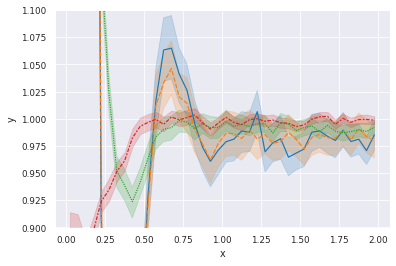

In [47]:
ax = plt.gca()
sns.lineplot(data=generate_aggdf(df, taus[0]), x='x', y='y', hue='dispersal', style='dispersal', ci=95, ax=ax, legend=False)
ax.set_ylim(.9, 1.1)

In [74]:
print(fr'$\tau = {taus[7]}$')

$\tau = 10.0$


## ODE predictions

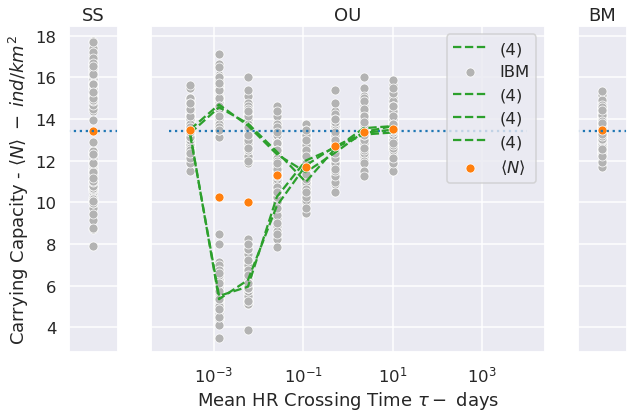

In [36]:
fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]}, figsize=(10,6))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle \; - \; ind/km^2$")

# SS
axSS = sns.scatterplot(data=df[df['mov'] == 'SS'], y='carrCap', x= 'interRate', ax = axSS, color='0.7')
axSS = sns.scatterplot(y=df[df['mov'] == 'SS']['carrCap'].mean(), x= [1.], ax = axSS, color='C1')
axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")

# OU
axOU = sns.scatterplot(data=df[df['mov'] == 'OU'], y='carrCap', x='tau', ax=axOU, color='0.7', label='IBM')
# mean
taus = list(df.groupby('tau').mean()['aveN'].index)
meanN = df.groupby('tau').mean()['aveN']/((df['envSize'][0]*df['envSize'][0]))
axOU = sns.scatterplot(y=meanN, x=taus, ax=axOU, color='C1', label=r'$\left\langle N \right\rangle$', zorder=200)
axOU.set_title("OU")
axOU.set_xscale('log')
axOU.set_xlabel(r'Mean HR Crossing Time $\tau - $ days')

# BM
axBM = sns.scatterplot(data=df[df['mov'] == 'BM'], y='carrCap', x= 'interRate', ax = axBM, color='0.7')
axBM = sns.scatterplot(y=df[df['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2*np.pi*df['interDistance'][0]*df['interDistance'][0])
axOU.hlines([MFpred], 1e-4, 1e4, linestyles=':', label='MF')
axBM.hlines([MFpred], .9, 1.1, linestyles=':')
axSS.hlines([MFpred], .9, 1.1, linestyles=':')

# Empirical
for d in dispersals:
    axOU.plot(taus, [df.loc[(df['mov'] == 'OU') & (df['tau'] == t) & (df['dispersal'] == d)]['empiricalN'].iloc[0] for t in taus], '--', color='C2', label='(4)')
# axSS.hlines(df.loc[(df['mov'] == 'SS')]['empiricalN'].iloc[0],.9, 1.1, linestyles='--', colors='C2')
# axBM.hlines(df.loc[(df['mov'] == 'BM')]['empiricalN'].iloc[0],.9, 1.1, linestyles='--', colors='C2')
# axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', label='MF')
# axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--')
# axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--')
# axOU.set_xlim(1e-3, 1e3)
# axSS.set_xlim(.95, 1.05)
# axBM.set_xlim(.95, 1.05)

# Finite-size
# xs = np.geomspace(1e-3, 1e3, num=200)
# ys = [finite_size_carr_cap(b=df['birthRate'][0], d=df['deathRate'][0], tau=t, g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=inter_rate_for_compatibility_with_JTB_paper) for t in xs]
# axOU.plot(xs, ys, '-', lw=2, color='C3', label='(7)')

# ys = [JTB_carr_cap_torus(b=df['birthRate'][0], d=df['deathRate'][0], tau=t, g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=inter_rate_for_compatibility_with_JTB_paper) for t in xs]
# axOU.plot(xs, ys, '-', lw=2, color='C4', label='torus')

# ys = [JTB_carr_cap(b=df['birthRate'][0], d=df['deathRate'][0], tau=t, g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=inter_rate_for_compatibility_with_JTB_paper) for t in xs]
# axOU.plot(xs, ys, ':', color='C4', label='FS')



# axOU.set_xlim(2e-3, 5e2)
axSS.set_xlim(.95, 1.05)
axBM.set_xlim(.95, 1.05)
# axOU.set_ylim(7, 18)


#get handles and labels
handles, labels = axOU.get_legend_handles_labels()

#specify order of items in legend
order = [3, 4, 0, 1, 2, 5]

#add legend to plot
axOU.legend([handles[idx] for idx in order], [labels[idx] for idx in order])
# axOU.legend()

In [15]:
df

,index,T,steps,aveN,id,tau,gsqrt,birthRate,deathRate,interDistance,interRate,envSize,cause,testValue,mov,carrCap
0,0,19.163827,5500,88.049490,0,0.030000,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.060056,OU,5.503093
1,1,36.026295,5600,46.014738,0,0.013925,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.064944,OU,2.875921
2,2,11.699932,5150,101.296715,0,0.064633,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.063882,OU,6.331045
3,3,7.279880,5050,170.800648,0,30.000000,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.059460,OU,10.675040
4,4,7.275561,5050,183.384649,0,139.247665,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.060056,OU,11.461541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,7995,7.663803,5950,191.136187,99,6.463304,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.064094,OU,11.946012
7996,7996,7.175425,5100,221.665142,99,139.247665,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.056138,OU,13.854071
7997,7997,10.152785,8300,220.813027,99,0.003000,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.064944,OU,13.800814
7998,7998,6.470778,5050,193.095950,99,64.633041,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.061118,OU,12.068497


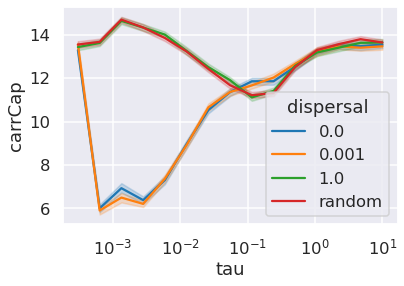

In [23]:
ax = sns.lineplot(data=df, x='tau', y='carrCap', hue='dispersal')
ax.set_xscale('log')

(0.0, 15.0)

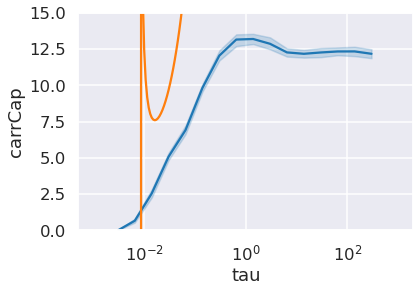

In [17]:
ax = sns.lineplot(data=df[df['dispersal'] == 0.], x='tau', y='carrCap')
ax.set_xscale('log')

xs = np.geomspace(1e-3, 1e3, num=200)
ys = [JTB_0lambda_carr_cap(b=df['birthRate'][0], d=df['deathRate'][0], tau=t, g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=inter_rate_for_compatibility_with_JTB_paper) for t in xs]
ax.plot(xs, ys)

ax.set_ylim(0, 15)

In [2]:
fig, ax = plt.subplots(figsize=(10,6))

ax.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle \; - \; ind/km^2$")


# OU
ax = sns.scatterplot(data=df[df['mov'] == 'OU'], y='carrCap', x='tau', ax=ax, color='0.7', label='IBM')
# mean
taus = list(df.groupby('tau').mean()['aveN'].index)
ax.set_title("OU")
ax.set_xscale('log')
ax.set_xlabel(r'Mean HR Crossing Time $\tau - $ days')


for idx, v in enumerate([0., 1., 2., 4., 'random']):
    meanN = df[df['d']].groupby('tau').mean()['aveN']/((df['envSize'][0]*df['envSize'][0]))
    ax = sns.scatterplot(y=meanN, x=taus, ax=ax, color='C1', label=r'$\left\langle N \right\rangle$', zorder=200)

# Predictions
# Mean-field
MFpred = (df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2*np.pi*df['interDistance'][0]*df['interDistance'][0])
ax.hlines([MFpred], 1e-4, 1e4, linestyles=':', label='MF')


ax.set_xlim(2e-3, 5e2)
# ax.set_ylim(7, 18)


#get handles and labels
handles, labels = axOU.get_legend_handles_labels()

#specify order of items in legend
# order = [3, 4, 0, 1, 2, 5]

#add legend to plot
# ax.legend([handles[idx] for idx in order], [labels[idx] for idx in order])
ax.legend()

NameError: name 'plt' is not defined

## LambdaZero

In [2]:
def run_environment(dic):
        Env = dic['env']
        env = Env(Nagents=100,
                inter_distance=.3,
                birth_rate=2.,
                death_rate=.1,
                inter_rate=1.,
                taus=dic['taus'],
                g_sqrts=np.sqrt(5.6),
                centers=np.zeros((100, 2)), # <<<<<<
                dispersal_kernel=0., # <<<<<<<<<<<
                data_interval=50,
                transient_steps=int(5e3),
                env_size=4.,
                seed=dic['seed'],
                id=dic['rep'])
        return env.run(int(1e6))

In [3]:
reps = 40
taus = np.geomspace(3e-3, 3e2, num=16)#[3e-3, 3e-2, 3e-1 , 3e1, 3e3]#, 3e5] # 3e-7, 

seed = 4567

simsOU = []
simsBM = []
simsSS = []
for rep in range(reps):
    for t in taus:
        simsOU.append({'taus':t, 'rep':rep, 'seed': seed, 'env': EnvOU})
        seed += 1
    simsBM.append({'taus':None, 'rep':rep, 'seed': seed, 'env': EnvBM})
    seed += 1
    simsSS.append({'taus':None, 'rep':rep, 'seed': seed, 'env': EnvSess})
    seed += 1

dics = [{'taus':None, 'rep':rep, 'seed': None} for rep in range(reps)]

new_resBM = p_umap(run_environment, simsBM)
new_resBM = [d | {'mov': 'BM'} for d in new_resBM]
new_resSS = p_umap(run_environment, simsSS)
new_resSS = [d | {'mov': 'SS'} for d in new_resSS]
new_resOU = p_umap(run_environment, simsOU)
new_resOU = [d | {'mov': 'OU'} for d in new_resOU]

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers =

  0%|          | 0/40 [00:00<?, ?it/s]

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_RBM.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers =

  0%|          | 0/40 [00:00<?, ?it/s]

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_sessile.py:338: RuntimeWarning: invalid value encountered in true_divide
  PCF = PCF/(2*np.pi*bin_midpoints*dr * dens)
/home/rafael/M/Arqui

  0%|          | 0/640 [00:00<?, ?it/s]

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_OU.py:45: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers == 'random':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_OU.py:47: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif centers == 'origin':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_OU.py:47: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif centers == 'origin':
/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_OU.py:45: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if centers =

In [4]:
# resBM2 = resBM.copy()
# del resBM2[]
df2 = pd.DataFrame.from_records(new_resOU, exclude=['PCFxs', 'PCFys', 'PCF2xs', 'PCF2ys'])
df2 = df2.append(pd.DataFrame.from_records(new_resBM, exclude=['PCFxs', 'PCFys']))
df2 = df2.append(pd.DataFrame.from_records(new_resSS, exclude=['PCFxs', 'PCFys']))
# df2['deathRate'] = .1
df2['carrCap'] = df2['aveN']/(df2['envSize']*df2['envSize'])
df2 = df2.reset_index()

In [5]:
df2

,index,T,steps,aveN,id,tau,gsqrt,birthRate,deathRate,interDistance,interRate,envSize,cause,testValue,mov,carrCap
0,0,19.163827,5500,88.049490,0,0.03,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.060056,OU,5.503093
1,1,11.699932,5150,101.296715,0,0.064633,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.063882,OU,6.331045
2,2,10.974332,5050,103.083062,1,0.064633,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.051319,OU,6.442691
3,3,36.026295,5600,46.014738,0,0.013925,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.064944,OU,2.875921
4,4,37.573722,5450,43.499752,1,0.013925,2.366432,2.0,0.1,0.3,1.0,4.0,equilibrium,0.064944,OU,2.718735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,35,82.747277,1384,0.000000,33,None,None,2.0,0.1,0.3,1.0,4.0,extinct,NaN,SS,0.000000
716,36,82.747277,1384,0.000000,28,None,None,2.0,0.1,0.3,1.0,4.0,extinct,NaN,SS,0.000000
717,37,82.747277,1384,0.000000,35,None,None,2.0,0.1,0.3,1.0,4.0,extinct,NaN,SS,0.000000
718,38,82.747277,1384,0.000000,34,None,None,2.0,0.1,0.3,1.0,4.0,extinct,NaN,SS,0.000000


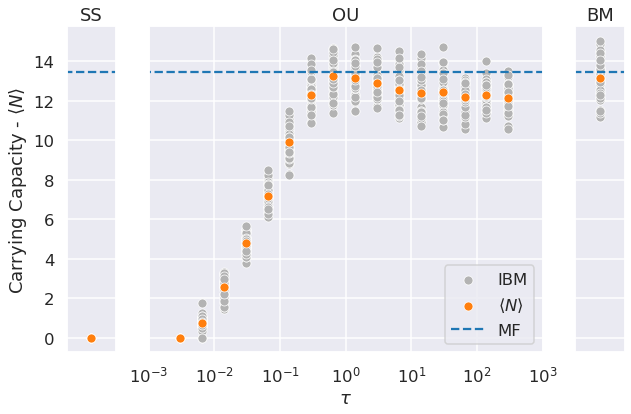

In [10]:
fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]}, figsize=(10,6))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle$")

# SS
axSS = sns.scatterplot(data=df2[df2['mov'] == 'SS'], y='carrCap', x= 'interRate', ax = axSS, color='0.7')
axSS = sns.scatterplot(y=df2[df2['mov'] == 'SS']['carrCap'].mean(), x= [1.], ax = axSS, color='C1')
axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")

# OU
axOU = sns.scatterplot(data=df2[df2['mov'] == 'OU'], y='carrCap', x='tau', ax=axOU, color='0.7', label='IBM')
# mean
taus = df2.groupby('tau').mean()['aveN'].index
meanN = df2.groupby('tau').mean()['aveN']/((df2['envSize'][0]*df2['envSize'][0]))
axOU = sns.scatterplot(y=meanN, x=taus, ax=axOU, color='C1', label=r'$\left\langle N \right\rangle$')
axOU.set_title("OU")
axOU.set_xscale('log')
axOU.set_xlabel(r'$\tau$')

# BM
axBM = sns.scatterplot(data=df2[df2['mov'] == 'BM'], y='carrCap', x= 'interRate', ax = axBM, color='0.7')
axBM = sns.scatterplot(y=df2[df2['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df2['birthRate'][0] - df2['deathRate'][0])/(df2['interRate'][0]/2*np.pi*df2['interDistance'][0]*df2['interDistance'][0])
axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', label='MF')
axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axOU.set_xlim(1e-3, 1e3)
axSS.set_xlim(.95, 1.05)
axBM.set_xlim(.95, 1.05)

# axOU.set_ylim(8, 19)


axOU.legend(loc='lower right')

In [21]:
def log0(x):
    if x is None:
        return None
    elif x == 0:
        return -1e10
    else:
        return np.log(x)

In [122]:
a = df2[df2['mov'] == 'OU'].pivot(columns=['tau'], values=['carrCap']).to_numpy()
a = [[x for x in s if ~np.isnan(x)] for s in a.T]
a = np.array(a)

Text(0.5, 0.98, 'No Dispersal')

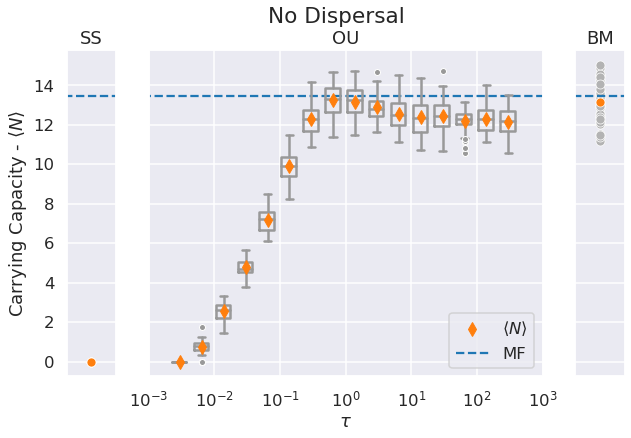

In [121]:
fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]}, figsize=(10,6))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle$")

# SS
axSS = sns.scatterplot(data=df2[df2['mov'] == 'SS'], y='carrCap', x= 'interRate', ax = axSS, color='0.7')
axSS = sns.scatterplot(y=df2[df2['mov'] == 'SS']['carrCap'].mean(), x= [1.], ax = axSS, color='C1')
axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")

# OU
taus = df2.groupby('tau').mean()['carrCap'].index
props = {'linewidth': 2.5, 'color': '0.6'}
axOU.boxplot(a.T, positions=taus, widths=taus/2, sym = '.', medianprops=props, boxprops=props, flierprops={'color': '0.6', 'markeredgecolor': '1.', 'markerfacecolor': '.6', 'markersize': '12'}, whiskerprops=props, capprops=props)
# mean
meanN = df2.groupby('tau')['carrCap'].mean()
axOU.plot(taus, meanN, 'd', color='C1', markersize=10, zorder=3, label=r'$\left\langle N \right\rangle$')
axOU.set_title("OU")
axOU.set_xscale('log')
axOU.set_xlabel(r'$\tau$')

# BM
axBM = sns.scatterplot(data=df2[df2['mov'] == 'BM'], y='carrCap', x= 'interRate', ax = axBM, color='0.7')
axBM = sns.scatterplot(y=df2[df2['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df2['birthRate'][0] - df2['deathRate'][0])/(df2['interRate'][0]/2*np.pi*df2['interDistance'][0]*df2['interDistance'][0])
axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', label='MF')
axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axOU.set_xlim(1e-3, 1e3)
axSS.set_xlim(.95, 1.05)
axBM.set_xlim(.95, 1.05)

# axOU.set_ylim(8, 19)

axOU.legend(loc='lower right')

fig.suptitle("No Dispersal")

No handles with labels found to put in legend.


Text(0.5, 0.98, 'No Dispersal')

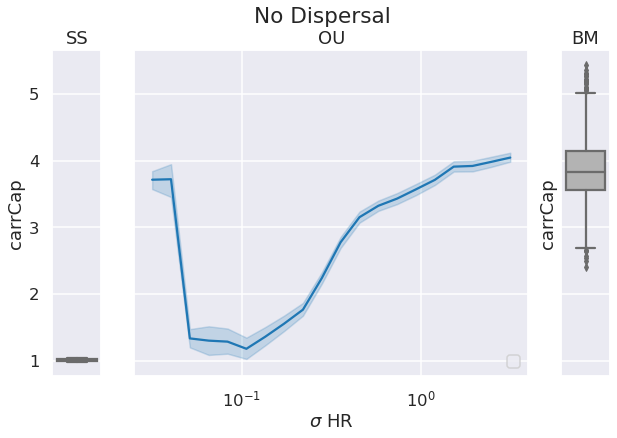

In [34]:
fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]}, figsize=(10,6))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle$")

df2 = df[df['dispersal'] == 0.0]

# SS
axSS = sns.boxplot(data=df2[df2['mov'] == 'SS'], y='carrCap', ax = axSS, color='0.7')
# axSS = sns.scatterplot(y=df2[df2['mov'] == 'SS']['carrCap'].mean(), x= [1.], ax = axSS, color='C1')
axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")

# OU
# taus = df2.groupby('tau').mean()['carrCap'].index
# props = {'linewidth': 2.5, 'color': '0.6'}
axOU = sns.lineplot(data=df2[df2['mov'] == 'OU'], y='carrCap', x='sigma', ax = axOU)
# mean
# meanN = df2.groupby('tau')['carrCap'].mean()
# axOU.plot(taus, meanN, 'd', color='C1', markersize=10, zorder=3, label=r'$\left\langle N \right\rangle$')
axOU.set_title("OU")
axOU.set_xscale('log')
axOU.set_xlabel(r'$\sigma$ HR')

# BM
axBM = sns.boxplot(data=df2[df2['mov'] == 'BM'], y='carrCap', ax = axBM, color='0.7')
# axBM = sns.scatterplot(y=df2[df2['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df2['birthRate'][0] - df2['deathRate'][0])/(df2['interRate'][0]/2*np.pi*df2['interDistance'][0]*df2['interDistance'][0])
# axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', label='MF')
# axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--')
# axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--')
# axOU.set_xlim(1e-3, 1e3)
# axSS.set_xlim(.95, 1.05)
# axBM.set_xlim(.95, 1.05)

# axOU.set_ylim(8, 19)

axOU.legend(loc='lower right')

fig.suptitle("No Dispersal")

NameError: name 'inter_rate_for_compatibility_with_JTB_paper' is not defined

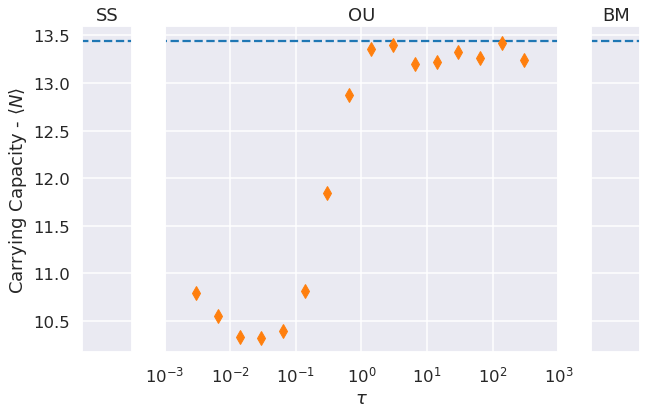

In [12]:
fig, (axSS, axOU, axBM) = plt.subplots(1, 3, sharey = True, gridspec_kw={'width_ratios': [0.1, 0.8, 0.1]}, figsize=(10,6))
axSS.set_ylabel(r"Carrying Capacity - $\left\langle N \right\rangle$")

# SS
axSS = sns.scatterplot(data=df[df['mov'] == 'SS'], y='carrCap', x= 'interRate', ax = axSS, color='0.7')
axSS = sns.scatterplot(y=df[df['mov'] == 'SS']['carrCap'].mean(), x= [1.], ax = axSS, color='C1')
axSS.set_title("SS")
axSS.set_xticks([])
axSS.set_xlabel("")

# OU
taus = df.groupby('tau').mean()['carrCap'].index
props = {'linewidth': 2.5, 'color': '0.6'}
# axOU.boxplot(a.T, positions=taus, widths=taus/2, sym = '.', medianprops=props, boxprops=props, flierprops={'color': '0.6', 'markeredgecolor': '1.', 'markerfacecolor': '.6', 'markersize': '12'}, whiskerprops=props, capprops=props)
# mean
meanN = df.groupby('tau')['carrCap'].mean()
axOU.plot(taus, meanN, 'd', color='C1', markersize=10, zorder=3, label=r'$\left\langle N \right\rangle$')
axOU.set_title("OU")
axOU.set_xscale('log')
axOU.set_xlabel(r'$\tau$')

# BM
axBM = sns.scatterplot(data=df[df['mov'] == 'BM'], y='carrCap', x= 'interRate', ax = axBM, color='0.7')
axBM = sns.scatterplot(y=df[df['mov'] == 'BM']['carrCap'].mean(), x= [1.], ax = axBM, color='C1')
axBM.set_title("BM")
axBM.set_xticks([])
axBM.set_xlabel("")

# Predictions
# Mean-field
MFpred = (df['birthRate'][0] - df['deathRate'][0])/(df['interRate'][0]/2*np.pi*df['interDistance'][0]*df['interDistance'][0])
axOU.hlines([MFpred], 1e-4, 1e4, linestyles='--', label='MF')
axBM.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axSS.hlines([MFpred], 1e-4, 1e4, linestyles='--')
axOU.set_xlim(1e-3, 1e3)
axSS.set_xlim(.95, 1.05)
axBM.set_xlim(.95, 1.05)


xs = np.geomspace(1e-3, 1e3, num=200)
ys = [JTB_0lambda_carr_cap(b=df['birthRate'][0], d=df['deathRate'][0], tau=t, g=5.6, q=df['interDistance'][0], L=df['envSize'][0], gamma=inter_rate_for_compatibility_with_JTB_paper) for t in xs]
axOU.plot(xs, ys)

# axOU.set_ylim(8, 19)

axOU.legend(loc='lower right')

fig.suptitle("No Dispersal")

## Automatic Plots

/home/rafael/M/Arquivos/scientia/pesquisa/2presente/Doutorado/1-SpatialLogistic/gillespie_implementation.py:192: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


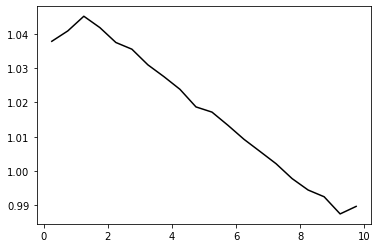

In [4]:
env.plot_PCF(max_dist=env.env_size/2, resolution=20)

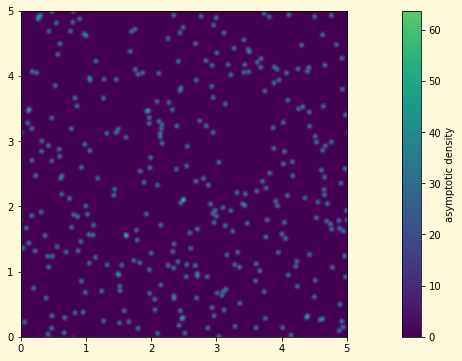

In [5]:
fig = env.plot_heatmap(200)

plt.show()

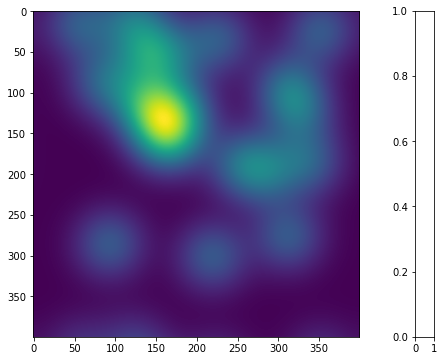

In [154]:
import matplotlib.pyplot as plt

fig, (ax, cax) = plt.subplots(ncols=2, gridspec_kw={'width_ratios': [0.95, 0.05]}, figsize=(7.5,6))

# fig.set_facecolor("#fff9db")

im = ax.imshow(asympt_distr(x, y, centers=costly_ghosted(4*rng.random(size=(20,2)), hshift=4.), stdev=.3), interpolation='bilinear')

# psm = ScalarMappable(norm=LogNorm(vmin=np.min(Z), vmax=np.max(Z)), cmap=cmap)
# fig.colorbar(psm, cax=cax, label='asymptotic density')

plt.show()

## Movies

In [7]:
import os
from moviepy.editor import ImageSequenceClip
from moviepy.video.io.bindings import mplfig_to_npimage


def gif(filename, array, fps=30, scale=1.0, mpl=False):
    """Creates a gif given a stack of images using moviepy
    Notes
    -----
    works with current Github version of moviepy (not the pip version)
    https://github.com/Zulko/moviepy/commit/d4c9c37bc88261d8ed8b5d9b7c317d13b2cdf62e
    Usage
    -----
    >>> X = randn(100, 64, 64)
    >>> gif('test.gif', X)
    Parameters
    ----------
    filename : string
        The filename of the gif to write to
    array : array_like
        A numpy array that contains a sequence of images
    fps : int
        frames per second (default: 10)
    scale : float
        how much to rescale each image by (default: 1.0)
    """

    # ensure that the file has the .gif extension
    fname, _ = os.path.splitext(filename)
    filename = fname + '.gif'

    # transform mpl figures into images
    if mpl is True:
        array = np.array([mplfig_to_npimage(fig) for fig in array])

    # copy into the color dimension if the images are black and white
    if array.ndim == 3:
        array = array[..., np.newaxis] * np.ones(3)

    # make the moviepy clip
    clip = ImageSequenceClip(list(array), fps=fps).resize(scale)
    clip.write_gif(filename, fps=fps)
    return clip

# matplot subplot
fig, ax = plt.subplots()

sol_N = sol.y[0]
sol_Q = sol.y[1]
sol_R = sol.y[2]

# method to get frames
def make_frame(idx):
    
    # clear
    ax.clear()
    
    # plotting line

    ax.plot(sol.t[:idx], sols[:, :idx].T)
    

#     if idx >= 1:
#         ax.plot(sol.t[idx-1], sols[idx-1], 'o', c='0.2')
#         ax.plot(sol.t[idx-1], sol_Q[idx-1], 'o', c='C1')
#         ax.plot(sol.t[idx-1], sol_R[idx-1], 'o', c='C2')
    
    ax.set_xlabel("Time")
    ax.set_ylabel("Concentrations")
#     plt.legend(loc="lower left")
    ax.set_ylim(0,.075)
    
    # returning mumpy image
    return mplfig_to_npimage(fig)


gif("irwin_Nt_evolution.gif", np.array([make_frame(x) for x in range(4, len(sol.t))]), fps=20)

In [14]:
def g(sigma, tau):
    return 2*sigma*sigma/tau

def glog(sigma, tau):
    return np.log(2) + np.log(sigma) - np.log(tau)

samples = 200
vals = np.geomspace(1e-4,1e4, num=200)

divers = np.array([glog(sigma,tau) for sigma in vals for tau in vals])
divers = np.reshape(divers, (samples, samples))

/tmp/ipykernel_2222763/1002687913.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([f'{1e-4 * 10**(8*x/samples):.0e}' for x in ax.get_yticks()])
/tmp/ipykernel_2222763/1002687913.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([f'{1e-4 * 10**(8*x/samples):.0e}' for x in ax.get_xticks()])


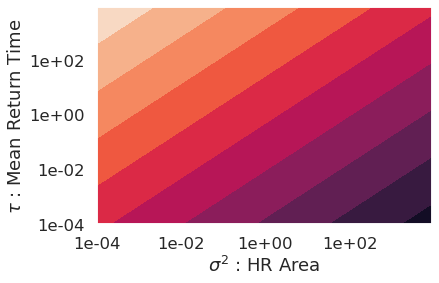

In [35]:
import matplotlib as mpl

# MATPLOTLIB SETUP
fig, ax = plt.subplots()

# CREATE GRADIENT
# new_cmap = truncate_colormap(plt.get_cmap('copper_r'), 0., .85)

#>> PLOTS <<
# CONTOURS
contours = ax.contourf(divers, levels = 10)#, cmap=new_cmap)


# COLORBAR
# cbar = fig.colorbar(contours, cax=cax)
# cax.set_ylabel(r'$\bar{p}$ : Participação PPI')
# cax.set_yticklabels([f'{x:.0%}' for x in cax.get_yticks()])
# cax.hlines(0.5, 0, 1, 'C1', lw=7)


# AXES LIM AND TICKS
# ax.set_xlim(-.7,50)
# ax.set_ylim(0,100)
# Change major ticks to show every 20.
ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(50))
ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(50))
# Change tick labels
ax.set_yticklabels([f'{1e-4 * 10**(8*x/samples):.0e}' for x in ax.get_yticks()])
ax.set_xticklabels([f'{1e-4 * 10**(8*x/samples):.0e}' for x in ax.get_xticks()])

# ax.set_xscale('log')
# ax.set_yscale('log')

# LABELS
# ax.set_title("Participação PPI (%)")
ax.set_xlabel(r'$\sigma^2$ : HR Area')
ax.set_ylabel(r'$\tau$ : Mean Return Time')

fig.savefig('scheme.svg')